In [16]:
from glob import glob
import numpy as np
import os

In [17]:
os.path.abspath(glob('Results/ROI_12_Layer_28/ROI_12_Layer_28_0_Vgg/*')[0])

'/home/jose/Desktop/lucent-things/Results/ROI_12_Layer_28/ROI_12_Layer_28_0_Vgg/Vgg_model_12_28_epoch_2_loss_0.03436415874376114_sparsity_0.001_smoothness_0.001_groupsparsity_0.01.pt'

In [18]:
import torch
from lucent.modelzoo import vgg19, util
from cadena_model_vgg import VggModel
from lucent.optvis import render, param, transform, objectives

vgg_pretrained = vgg19(pretrained = True)

gpu_to_use = 0
n_neurons = 29
layer = 12


GPU = torch.cuda.is_available()
net = VggModel(pretrained_model=vgg_pretrained, conv_layer=28, num_neurons=29, device = torch.device("cuda:"+str(gpu_to_use) if GPU else "cpu"))
net.cuda()


#net.load_state_dict(torch.load('E:/Jose/models\\model_9_0_1668242975_epoch_2_loss_0.21454372439322444.pt', map_location=torch.device("cuda:"+str(gpu_to_use) if GPU else "cpu")))
#model_to_load = 'E:/Jose/Results/ROI_3_Layer_10/ROI_3_Layer_10_0/Vgg_model_3_10_epoch_19_loss_0.09356637168213405.pt'
model_to_load = '/home/jose/Desktop/lucent-things/Results/ROI_12_Layer_28/ROI_12_Layer_28_0_Vgg/Vgg_model_12_28_epoch_2_loss_0.03436415874376114_sparsity_0.001_smoothness_0.001_groupsparsity_0.01.pt'
net.load_state_dict(torch.load(model_to_load, map_location=torch.device("cuda:"+str(gpu_to_use) if GPU else "cpu")))

/home/jose/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jose/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


conv_layer:   28 <class 'int'>
FTE:          [0, 2, 5, 7, 10, 12, 14, 16, 19, 21, 23, 25, 28, 30, 32, 34]
conv in FTE True



features.28
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
[512, 14, 14, 29]


<All keys matched successfully>

100%|██████████| 512/512 [00:27<00:00, 18.83it/s]



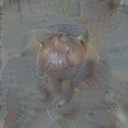
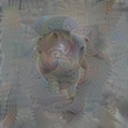
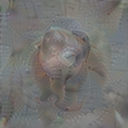
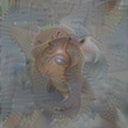
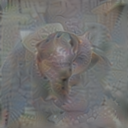

In [19]:
all_transforms = [ ## <--- parameters
#transform.pad(2),
transform.jitter(8),
transform.random_scale([n/1000. for n in range(975, 1050)]),
transform.random_rotate(list(range(-5,5))),
transform.jitter(4)
]

param_f = lambda: param.image(128, fft=True, batch = 5, decorrelate=True)
cppn_opt = lambda params: torch.optim.Adam(params, 1e-2, weight_decay=1e-4)
obj = objectives.channel('output', np.array(list(range(29))))
img = render.render_vis(net, obj, param_f, cppn_opt, transforms=all_transforms, show_inline=True)

100%|██████████| 512/512 [00:26<00:00, 19.40it/s]



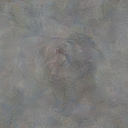
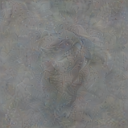
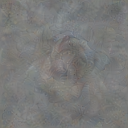
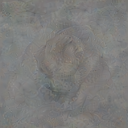
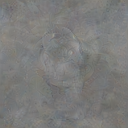

In [20]:
all_transforms = []

param_f = lambda: param.image(128, fft=True, batch = 5, decorrelate=True)
cppn_opt = lambda params: torch.optim.Adam(params, 1e-2, weight_decay=1e-4)
obj = objectives.channel('output', np.array(list(range(29))))
img = render.render_vis(net, obj, param_f, cppn_opt, transforms=all_transforms, show_inline=True)

0
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 75.64it/s]



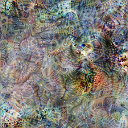

1
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 75.18it/s]



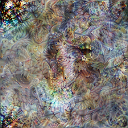

2
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 75.67it/s]



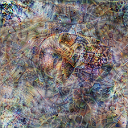

3
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.04it/s]



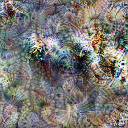

4
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.97it/s]



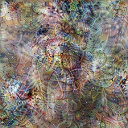

5
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.79it/s]



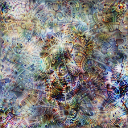

6
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.12it/s]



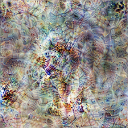

7
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.22it/s]



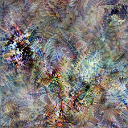

8
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.01it/s]



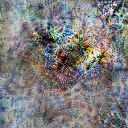

9
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.36it/s]



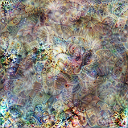

10
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.40it/s]



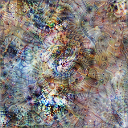

11
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.39it/s]



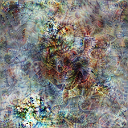

12
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.80it/s]



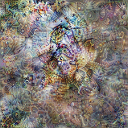

13
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.60it/s]



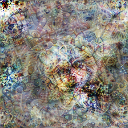

14
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.11it/s]



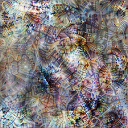

15
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.53it/s]



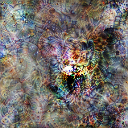

16
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.57it/s]



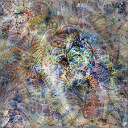

17
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.11it/s]



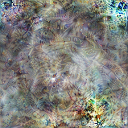

18
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.22it/s]



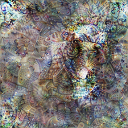

19
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.34it/s]



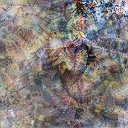

20
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.10it/s]



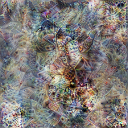

21
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.23it/s]



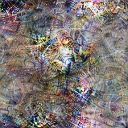

22
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.83it/s]



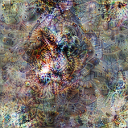

23
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.89it/s]



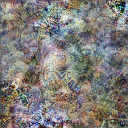

24
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.91it/s]



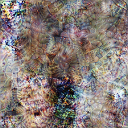

25
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.22it/s]



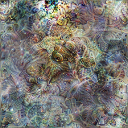

26
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.01it/s]



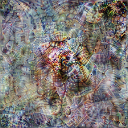

27
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.95it/s]



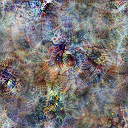

28
FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 76.25it/s]



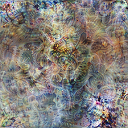

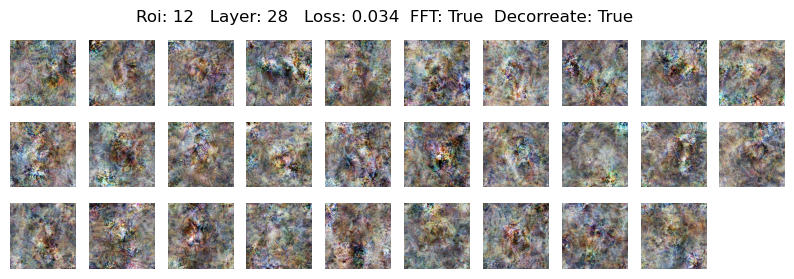

In [21]:
import matplotlib.pyplot as plt

list_of_images = []
n_neurons = 29
for i in range(0, n_neurons):
    print(i)
    print('FFT: True,  Decorrelate: True')
    param_f = lambda: param.image(128, fft=True, decorrelate=True)
    img = render.render_vis(net, 'output:'+str(i), param_f, transforms=[], show_inline=True)
    list_of_images.append(img[0][0])


f, ax = plt.subplots(n_neurons//10+1, 10, figsize = (10,n_neurons//10+1))

f.suptitle('Roi: 12   Layer: 28   Loss: 0.034  FFT: True  Decorreate: True')

for i in range(len(list_of_images)):
    ax[i//10, i%10].imshow(np.array(list_of_images[i]))
    ax[i//10, i%10].axis('off')
        
for i in range(len(list_of_images), (n_neurons//10+1)*10):
        f.delaxes(ax[i//10, i%10])

#plt.savefig('/home/jose/Desktop/Paolo_meeting/ROI_12_Layer_28_loss_0.034___fft_true_decorrelate_true.png')

0
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 76.33it/s]



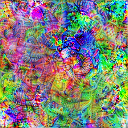

1
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 76.71it/s]



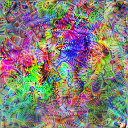

2
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.04it/s]



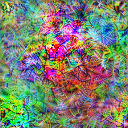

3
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.29it/s]



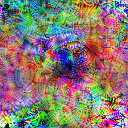

4
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 75.61it/s]



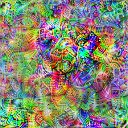

5
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 76.28it/s]



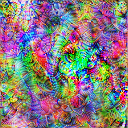

6
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 76.87it/s]



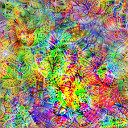

7
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 76.95it/s]



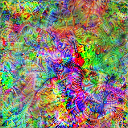

8
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 76.69it/s]



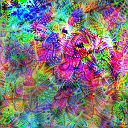

9
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.40it/s]



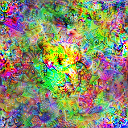

10
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.62it/s]



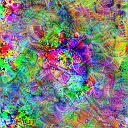

11
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.49it/s]



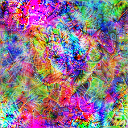

12
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.26it/s]



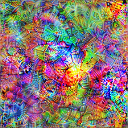

13
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.55it/s]



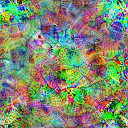

14
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.45it/s]



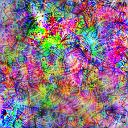

15
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.60it/s]



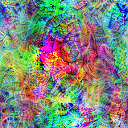

16
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.58it/s]



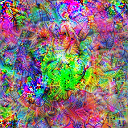

17
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.57it/s]



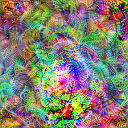

18
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.43it/s]



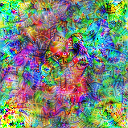

19
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.44it/s]



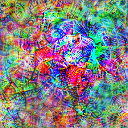

20
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.22it/s]



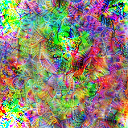

21
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.04it/s]



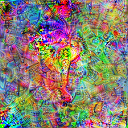

22
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.19it/s]



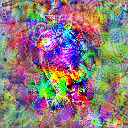

23
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.11it/s]



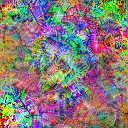

24
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 76.51it/s]



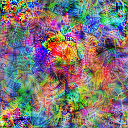

25
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.38it/s]



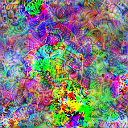

26
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.73it/s]



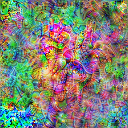

27
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.10it/s]



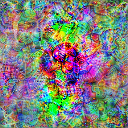

28
FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.19it/s]



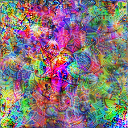

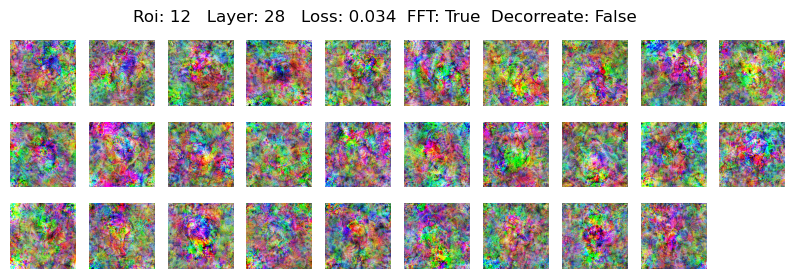

In [22]:
import matplotlib.pyplot as plt

list_of_images = []
n_neurons = 29
for i in range(0, n_neurons):
    print(i)
    print('FFT: True,  Decorrelate: False')
    param_f = lambda: param.image(128, fft=True, decorrelate=False)
    img = render.render_vis(net, 'output:'+str(i), param_f, transforms=[], show_inline=True)
    list_of_images.append(img[0][0])


f, ax = plt.subplots(n_neurons//10+1, 10, figsize = (10,n_neurons//10+1))

f.suptitle('Roi: 12   Layer: 28   Loss: 0.034  FFT: True  Decorreate: False')

for i in range(len(list_of_images)):
    ax[i//10, i%10].imshow(np.array(list_of_images[i]))
    ax[i//10, i%10].axis('off')
        
for i in range(len(list_of_images), (n_neurons//10+1)*10):
        f.delaxes(ax[i//10, i%10])

#plt.savefig('/home/jose/Desktop/Paolo_meeting/ROI_12_Layer_28_loss_0.034___fft_true_decorrelate_false.png')

0
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.51it/s]



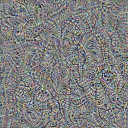

1
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.21it/s]



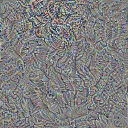

2
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.55it/s]



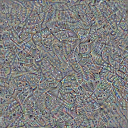

3
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.73it/s]



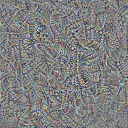

4
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.66it/s]



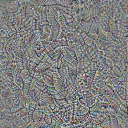

5
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.56it/s]



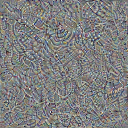

6
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.76it/s]



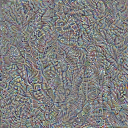

7
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.58it/s]



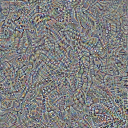

8
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.62it/s]



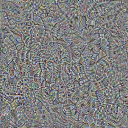

9
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.57it/s]



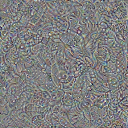

10
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.57it/s]



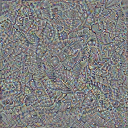

11
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.55it/s]



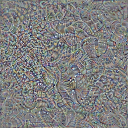

12
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.63it/s]



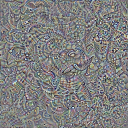

13
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.65it/s]



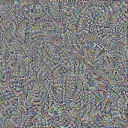

14
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.73it/s]



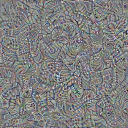

15
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.56it/s]



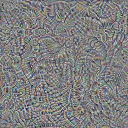

16
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.55it/s]



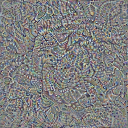

17
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.75it/s]



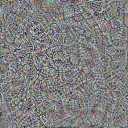

18
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.59it/s]



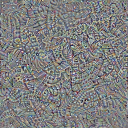

19
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.66it/s]



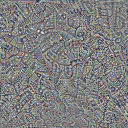

20
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.53it/s]



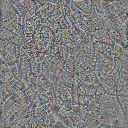

21
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.35it/s]



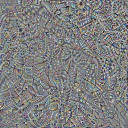

22
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.75it/s]



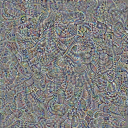

23
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.52it/s]



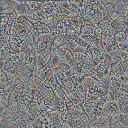

24
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.62it/s]



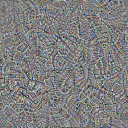

25
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.82it/s]



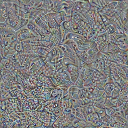

26
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.36it/s]



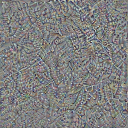

27
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.35it/s]



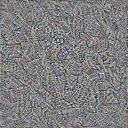

28
FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 77.42it/s]



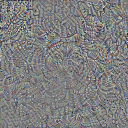

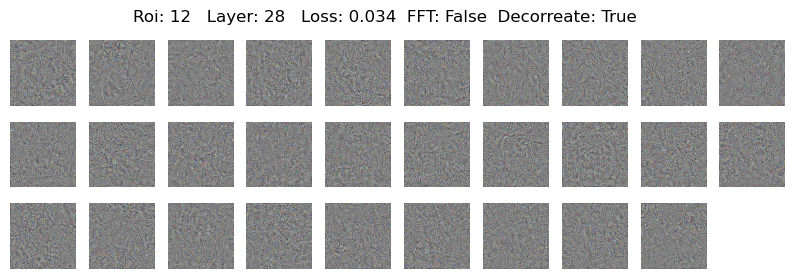

In [23]:
import matplotlib.pyplot as plt

list_of_images = []
n_neurons = 29
for i in range(0, n_neurons):
    print(i)
    print('FFT: False,  Decorrelate: True')
    param_f = lambda: param.image(128, fft=False, decorrelate=True)
    img = render.render_vis(net, 'output:'+str(i), param_f, transforms=[], show_inline=True)
    list_of_images.append(img[0][0])


f, ax = plt.subplots(n_neurons//10+1, 10, figsize = (10,n_neurons//10+1))

f.suptitle('Roi: 12   Layer: 28   Loss: 0.034  FFT: False  Decorreate: True')

for i in range(len(list_of_images)):
    ax[i//10, i%10].imshow(np.array(list_of_images[i]))
    ax[i//10, i%10].axis('off')
        
for i in range(len(list_of_images), (n_neurons//10+1)*10):
        f.delaxes(ax[i//10, i%10])

#plt.savefig('/home/jose/Desktop/Paolo_meeting/ROI_12_Layer_28_loss_0.034___fft_false_decorrelate_true.png')

0
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.95it/s]



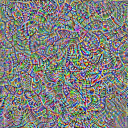

1
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.38it/s]



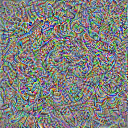

2
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.21it/s]



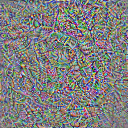

3
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.30it/s]



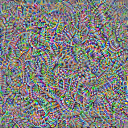

4
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 76.92it/s]



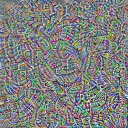

5
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.22it/s]



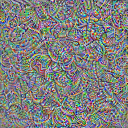

6
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.80it/s]



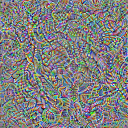

7
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.79it/s]



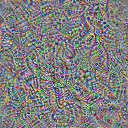

8
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.09it/s]



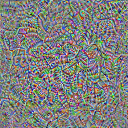

9
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.39it/s]



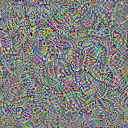

10
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.81it/s]



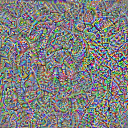

11
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.82it/s]



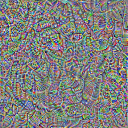

12
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.89it/s]



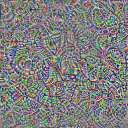

13
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 77.90it/s]



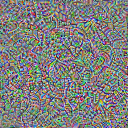

14
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.59it/s]



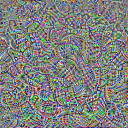

15
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.49it/s]



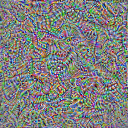

16
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.72it/s]



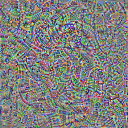

17
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.75it/s]



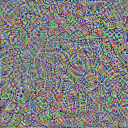

18
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.63it/s]



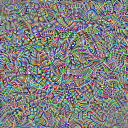

19
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.72it/s]



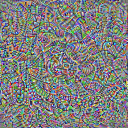

20
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.49it/s]



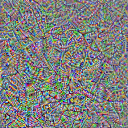

21
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.41it/s]



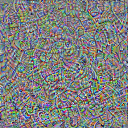

22
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.89it/s]



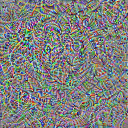

23
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.36it/s]



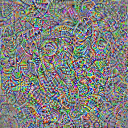

24
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.55it/s]



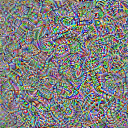

25
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.58it/s]



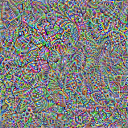

26
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.46it/s]



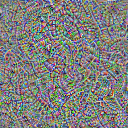

27
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.63it/s]



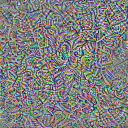

28
FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.44it/s]



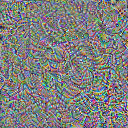

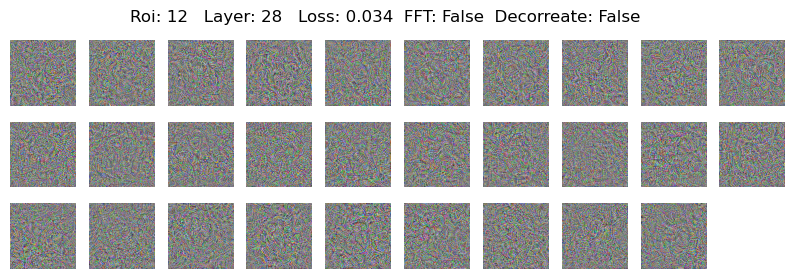

In [24]:
import matplotlib.pyplot as plt

list_of_images = []
n_neurons = 29
for i in range(0, n_neurons):
    print(i)
    print('FFT: False,  Decorrelate: False')
    param_f = lambda: param.image(128, fft=False, decorrelate=False)
    img = render.render_vis(net, 'output:'+str(i), param_f, transforms=[], show_inline=1)
    list_of_images.append(img[0][0])


f, ax = plt.subplots(n_neurons//10+1, 10, figsize = (10,n_neurons//10+1))

f.suptitle('Roi: 12   Layer: 28   Loss: 0.034  FFT: False  Decorreate: False')

for i in range(len(list_of_images)):
    ax[i//10, i%10].imshow(np.array(list_of_images[i]))
    ax[i//10, i%10].axis('off')
        
for i in range(len(list_of_images), (n_neurons//10+1)*10):
        f.delaxes(ax[i//10, i%10])

#plt.savefig('/home/jose/Desktop/Paolo_meeting/ROI_12_Layer_28_loss_0.034___fft_false_decorrelate_false.png')

FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.06it/s]



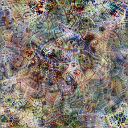

FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.95it/s]



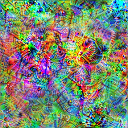

FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 78.55it/s]



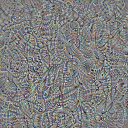

FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 78.85it/s]



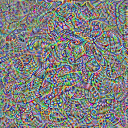

In [25]:
print('FFT: True,  Decorrelate: True')
param_f = lambda: param.image(128, fft=True, decorrelate=True)
_ = render.render_vis(net, 'output:0', param_f, transforms=[], show_inline=True)

print('FFT: True,  Decorrelate: False')
param_f = lambda: param.image(128, fft=True, decorrelate=False)
_ = render.render_vis(net, 'output:0', param_f, transforms=[], show_inline=True)

print('FFT: False,  Decorrelate: True')
param_f = lambda: param.image(128, fft=False, decorrelate=True)
_ = render.render_vis(net, 'output:0', param_f, transforms=[], show_inline=True)

print('FFT: False,  Decorrelate: False')
param_f = lambda: param.image(128, fft=False, decorrelate=False)
_ = render.render_vis(net, 'output:0', param_f, transforms=[], show_inline=True)

0


100%|██████████| 512/512 [00:07<00:00, 67.24it/s]



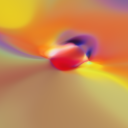

1


100%|██████████| 512/512 [00:07<00:00, 67.24it/s]



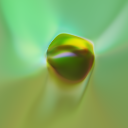

2


100%|██████████| 512/512 [00:07<00:00, 67.20it/s]



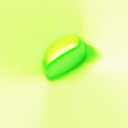

3


100%|██████████| 512/512 [00:07<00:00, 67.22it/s]



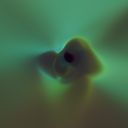

4


100%|██████████| 512/512 [00:07<00:00, 67.29it/s]



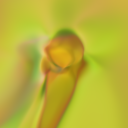

5


100%|██████████| 512/512 [00:07<00:00, 67.10it/s]



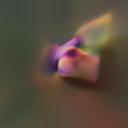

6


100%|██████████| 512/512 [00:07<00:00, 67.18it/s]



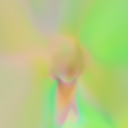

7


100%|██████████| 512/512 [00:07<00:00, 64.86it/s]



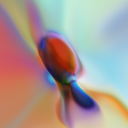

8


100%|██████████| 512/512 [00:07<00:00, 64.96it/s]



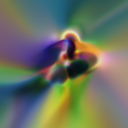

9


100%|██████████| 512/512 [00:08<00:00, 63.88it/s]



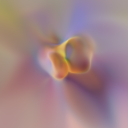

10


100%|██████████| 512/512 [00:07<00:00, 64.25it/s]



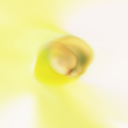

11


100%|██████████| 512/512 [00:08<00:00, 63.55it/s]



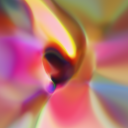

12


100%|██████████| 512/512 [00:08<00:00, 63.64it/s]



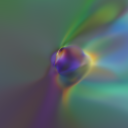

13


100%|██████████| 512/512 [00:07<00:00, 64.75it/s]



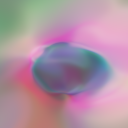

14


100%|██████████| 512/512 [00:07<00:00, 64.51it/s]



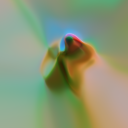

15


100%|██████████| 512/512 [00:07<00:00, 65.19it/s]



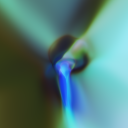

16


100%|██████████| 512/512 [00:07<00:00, 65.14it/s]



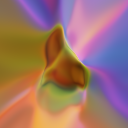

17


100%|██████████| 512/512 [00:07<00:00, 64.10it/s]



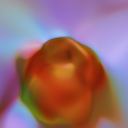

18


100%|██████████| 512/512 [00:08<00:00, 62.61it/s]



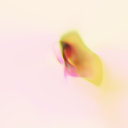

19


100%|██████████| 512/512 [00:08<00:00, 63.21it/s]



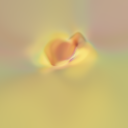

20


100%|██████████| 512/512 [00:07<00:00, 64.26it/s]



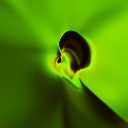

21


100%|██████████| 512/512 [00:07<00:00, 64.29it/s]



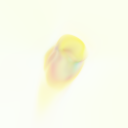

22


100%|██████████| 512/512 [00:07<00:00, 64.39it/s]



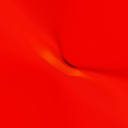

23


100%|██████████| 512/512 [00:08<00:00, 63.63it/s]



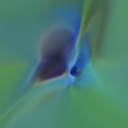

24


100%|██████████| 512/512 [00:08<00:00, 62.01it/s]



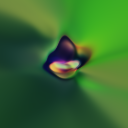

25


100%|██████████| 512/512 [00:07<00:00, 64.56it/s]



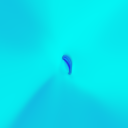

26


100%|██████████| 512/512 [00:07<00:00, 64.18it/s]



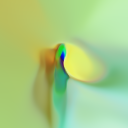

27


100%|██████████| 512/512 [00:07<00:00, 64.08it/s]



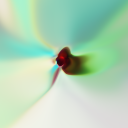

28


100%|██████████| 512/512 [00:08<00:00, 63.55it/s]



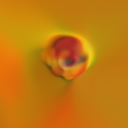

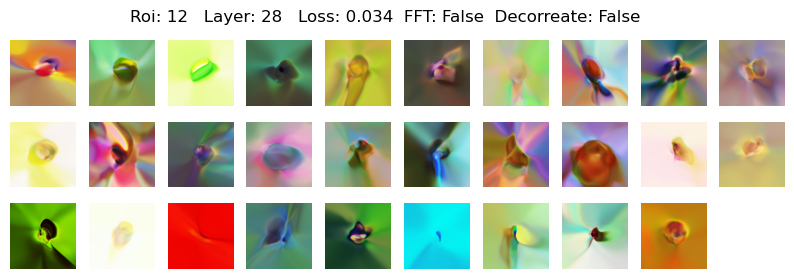

In [26]:
cppn_param_f = lambda: param.cppn(128)
cppn_opt     = lambda params: torch.optim.Adam(params, 5e-3)

list_of_images = []

for i in range(0, 29):
    print(i)
    img = render.render_vis(net, 'output:'+str(i), cppn_param_f, cppn_opt, transforms=[], show_inline=1)
    list_of_images.append(img[0][0])


f, ax = plt.subplots(n_neurons//10+1, 10, figsize = (10,n_neurons//10+1))

f.suptitle('Roi: 12   Layer: 28   Loss: 0.034  FFT: False  Decorreate: False')

for i in range(len(list_of_images)):
    ax[i//10, i%10].imshow(np.array(list_of_images[i]))
    ax[i//10, i%10].axis('off')
        
for i in range(len(list_of_images), (n_neurons//10+1)*10):
        f.delaxes(ax[i//10, i%10])

#plt.savefig('/home/jose/Desktop/Paolo_meeting/ROI_12_Layer_28_loss_0.034___ccpn_param.png')

100%|██████████| 512/512 [00:07<00:00, 64.27it/s]



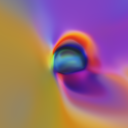

In [28]:
cppn_param_f = lambda: param.cppn(128)
cppn_opt     = lambda params: torch.optim.Adam(params, 5e-3)
_ = render.render_vis(net, 'output:15', cppn_param_f, cppn_opt, transforms=[], show_inline=True)

In [29]:
all_transforms = [
#transform.pad(2),
transform.jitter(8),
transform.random_scale([n/1000. for n in range(975, 1050)]),
transform.random_rotate(list(range(-5,5))),
transform.jitter(4)
]

batch_param_f = lambda: param.image(128, batch=5, fft=True, decorrelate=True)
cppn_opt = lambda params: torch.optim.Adam(params, 1e-2, weight_decay=1e-4)



In [30]:
#################################################################

FFT: True,  Decorrelate: True


100%|██████████| 512/512 [00:07<00:00, 71.55it/s]



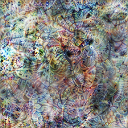

FFT: True,  Decorrelate: False


100%|██████████| 512/512 [00:07<00:00, 73.07it/s]



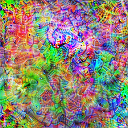

FFT: False,  Decorrelate: True


100%|██████████| 512/512 [00:06<00:00, 73.88it/s]



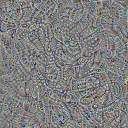

FFT: False,  Decorrelate: False


100%|██████████| 512/512 [00:06<00:00, 74.75it/s]



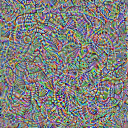

In [31]:
print('FFT: True,  Decorrelate: True')
param_f = lambda: param.image(128, fft=True, decorrelate=True)
_ = render.render_vis(net, 'output:0', param_f, transforms=[], show_inline=True)

print('FFT: True,  Decorrelate: False')
param_f = lambda: param.image(128, fft=True, decorrelate=False)
_ = render.render_vis(net, 'output:0', param_f, transforms=[], show_inline=True)

print('FFT: False,  Decorrelate: True')
param_f = lambda: param.image(128, fft=False, decorrelate=True)
_ = render.render_vis(net, 'output:0', param_f, transforms=[], show_inline=True)

print('FFT: False,  Decorrelate: False')
param_f = lambda: param.image(128, fft=False, decorrelate=False)
_ = render.render_vis(net, 'output:0', param_f, transforms=[], show_inline=True)

0


100%|██████████| 512/512 [00:08<00:00, 63.46it/s]



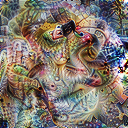

--------------------
1


100%|██████████| 512/512 [00:08<00:00, 63.17it/s]



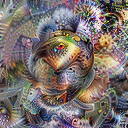

--------------------
2


100%|██████████| 512/512 [00:07<00:00, 66.84it/s]



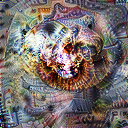

--------------------
3


100%|██████████| 512/512 [00:07<00:00, 66.56it/s]



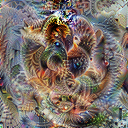

--------------------
4


100%|██████████| 512/512 [00:07<00:00, 66.54it/s]



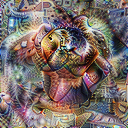

--------------------
5


100%|██████████| 512/512 [00:07<00:00, 66.58it/s]



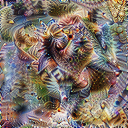

--------------------
6


100%|██████████| 512/512 [00:07<00:00, 66.57it/s]



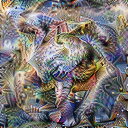

--------------------
7


100%|██████████| 512/512 [00:07<00:00, 66.50it/s]



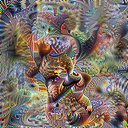

--------------------
8


100%|██████████| 512/512 [00:07<00:00, 66.45it/s]



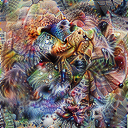

--------------------
9


100%|██████████| 512/512 [00:07<00:00, 66.64it/s]



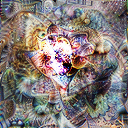

--------------------
10


100%|██████████| 512/512 [00:07<00:00, 66.55it/s]



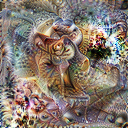

--------------------
11


100%|██████████| 512/512 [00:07<00:00, 66.28it/s]



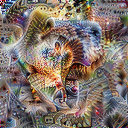

--------------------
12


100%|██████████| 512/512 [00:07<00:00, 66.03it/s]



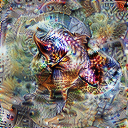

--------------------
13


100%|██████████| 512/512 [00:07<00:00, 65.99it/s]



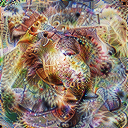

--------------------
14


100%|██████████| 512/512 [00:07<00:00, 65.88it/s]



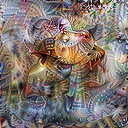

--------------------
15


100%|██████████| 512/512 [00:07<00:00, 66.10it/s]



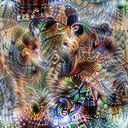

--------------------
16


100%|██████████| 512/512 [00:07<00:00, 65.87it/s]



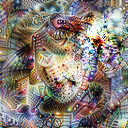

--------------------
17


100%|██████████| 512/512 [00:07<00:00, 65.84it/s]



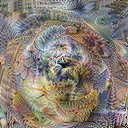

--------------------
18


100%|██████████| 512/512 [00:07<00:00, 65.88it/s]



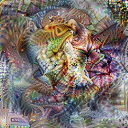

--------------------
19


100%|██████████| 512/512 [00:07<00:00, 65.93it/s]



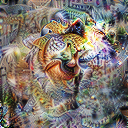

--------------------
20


100%|██████████| 512/512 [00:07<00:00, 65.84it/s]



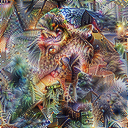

--------------------
21


100%|██████████| 512/512 [00:07<00:00, 65.86it/s]



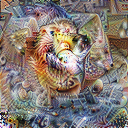

--------------------
22


100%|██████████| 512/512 [00:07<00:00, 65.19it/s]



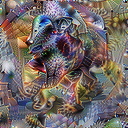

--------------------
23


100%|██████████| 512/512 [00:08<00:00, 62.99it/s]



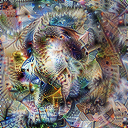

--------------------
24


100%|██████████| 512/512 [00:08<00:00, 61.04it/s]



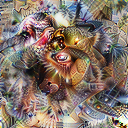

--------------------
25


100%|██████████| 512/512 [00:08<00:00, 61.54it/s]



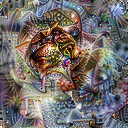

--------------------
26


100%|██████████| 512/512 [00:08<00:00, 61.18it/s]



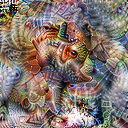

--------------------
27


100%|██████████| 512/512 [00:08<00:00, 59.13it/s]



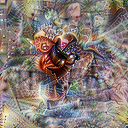

--------------------
28


100%|██████████| 512/512 [00:08<00:00, 60.93it/s]



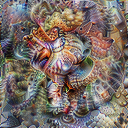

--------------------
29


  0%|          | 0/512 [00:00<?, ?it/s]


IndexError: index 29 is out of bounds for dimension 1 with size 29

In [32]:
list_imgs = []
for i in range(0, 100):
    print(i)
    img = render.render_vis(net, 'output:'+str(i), show_inline = 1)
    list_imgs.append(img[0][0, :, :, :])
    print('--------------------')

In [ ]:
import matplotlib.pyplot as plt

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43


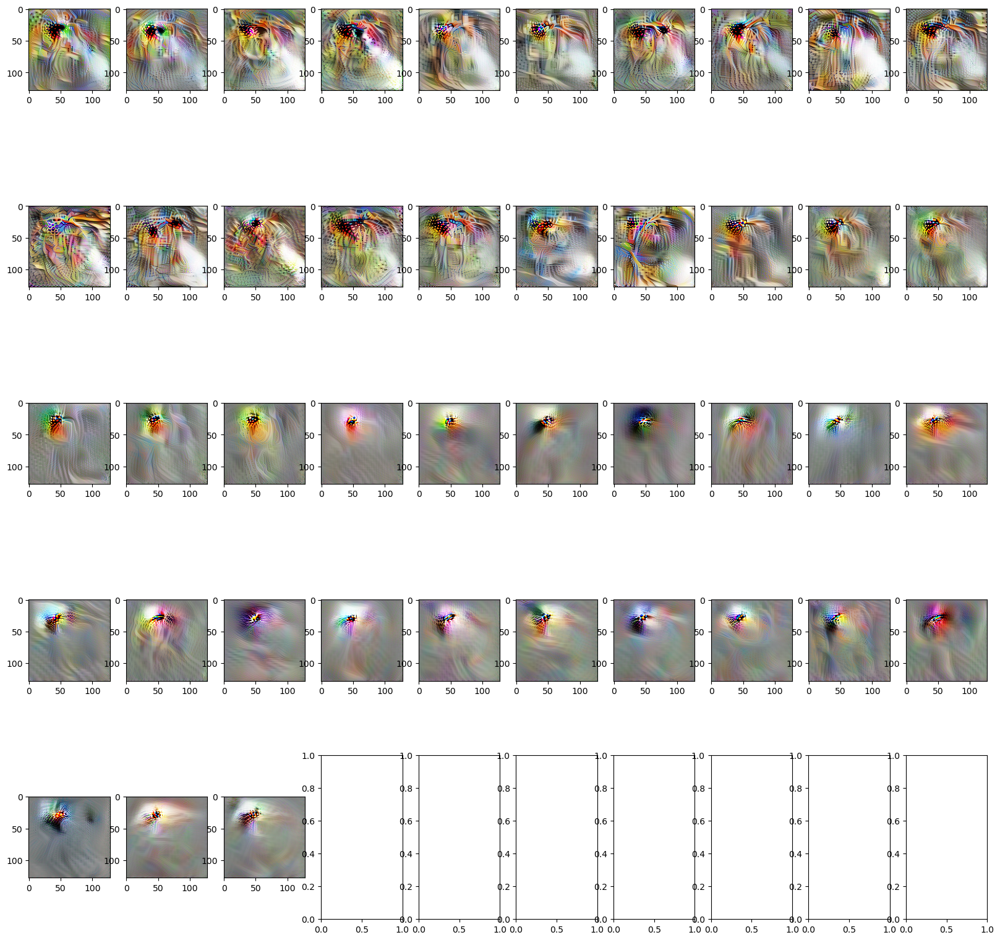

In [ ]:
import itertools
f, ax = plt.subplots(5,10, figsize=(20,20))
for n, (i, j) in enumerate(itertools.product(list(range(10)), list(range(10)))):
    print(n)
    if n == 43:
        break
    ax[i, j].imshow(list_imgs[n])
#plt.savefig('Model_3_10__neurons_lucent_amazing_fit.png', dpi=150)

In [ ]:

#plt.savefig('Model_3_10__neurons_lucent_great_fit.png', dpi=150)

<Figure size 640x480 with 0 Axes>

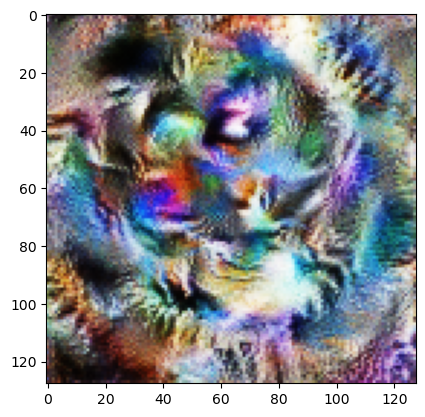

In [ ]:
plt.imshow(img[0][0, :, :, :])

c:\Users\lopez\Anaconda3\envs\test_install_cuda_with_pytorch\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
c:\Users\lopez\Anaconda3\envs\test_install_cuda_with_pytorch\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


conv_layer:   0 <class 'int'>
FTE:          [0, 2, 5, 7, 10, 12, 14, 16, 19, 21, 23, 25, 28, 30, 32, 34]
conv in FTE True



features.0
Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
[64, 224, 224, 43]
0


100%|██████████| 512/512 [00:19<00:00, 25.68it/s]



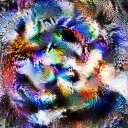

--------------------
1


100%|██████████| 512/512 [00:19<00:00, 25.90it/s]



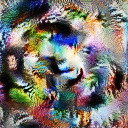

--------------------
2


100%|██████████| 512/512 [00:19<00:00, 26.04it/s]



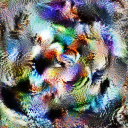

--------------------
3


100%|██████████| 512/512 [00:19<00:00, 26.29it/s]



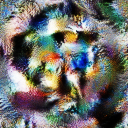

--------------------
4


100%|██████████| 512/512 [00:20<00:00, 25.33it/s]



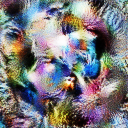

--------------------
5


100%|██████████| 512/512 [00:19<00:00, 25.60it/s]



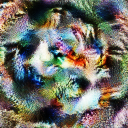

--------------------
6


100%|██████████| 512/512 [00:20<00:00, 25.28it/s]



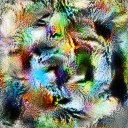

--------------------
7


100%|██████████| 512/512 [00:19<00:00, 25.73it/s]



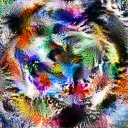

--------------------
8


100%|██████████| 512/512 [00:20<00:00, 25.34it/s]



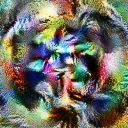

--------------------
9


100%|██████████| 512/512 [00:19<00:00, 25.66it/s]



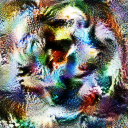

--------------------
10


100%|██████████| 512/512 [00:19<00:00, 26.20it/s]



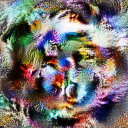

--------------------
11


100%|██████████| 512/512 [00:20<00:00, 24.55it/s]



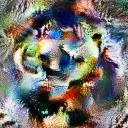

--------------------
12


100%|██████████| 512/512 [00:20<00:00, 24.60it/s]



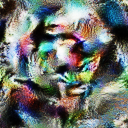

--------------------
13


100%|██████████| 512/512 [00:20<00:00, 24.70it/s]



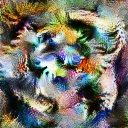

--------------------
14


100%|██████████| 512/512 [00:21<00:00, 24.26it/s]



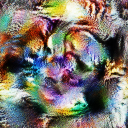

--------------------
15


100%|██████████| 512/512 [00:20<00:00, 25.59it/s]



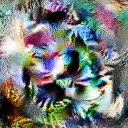

--------------------
16


100%|██████████| 512/512 [00:20<00:00, 24.60it/s]



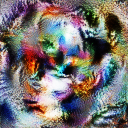

--------------------
17


100%|██████████| 512/512 [00:21<00:00, 24.29it/s]



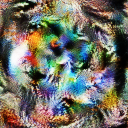

--------------------
18


100%|██████████| 512/512 [00:20<00:00, 25.38it/s]



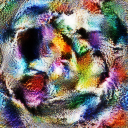

--------------------
19


100%|██████████| 512/512 [00:19<00:00, 26.23it/s]



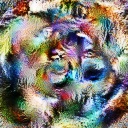

--------------------
20


100%|██████████| 512/512 [00:20<00:00, 24.58it/s]



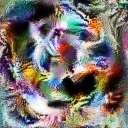

--------------------
21


100%|██████████| 512/512 [00:20<00:00, 25.30it/s]



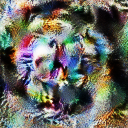

--------------------
22


100%|██████████| 512/512 [00:20<00:00, 24.81it/s]



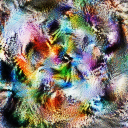

--------------------
23


100%|██████████| 512/512 [00:20<00:00, 24.88it/s]



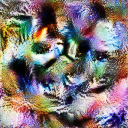

--------------------
24


100%|██████████| 512/512 [00:21<00:00, 23.92it/s]



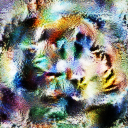

--------------------
25


100%|██████████| 512/512 [00:20<00:00, 24.84it/s]



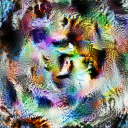

--------------------
26


100%|██████████| 512/512 [00:21<00:00, 24.15it/s]



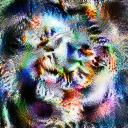

--------------------
27


100%|██████████| 512/512 [00:21<00:00, 23.68it/s]



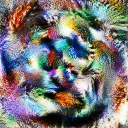

--------------------
28


100%|██████████| 512/512 [00:20<00:00, 24.55it/s]



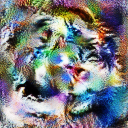

--------------------
29


100%|██████████| 512/512 [00:21<00:00, 24.15it/s]



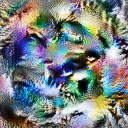

--------------------
30


100%|██████████| 512/512 [00:20<00:00, 25.30it/s]



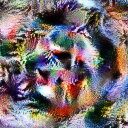

--------------------
31


100%|██████████| 512/512 [00:20<00:00, 25.27it/s]



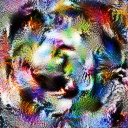

--------------------
32


100%|██████████| 512/512 [00:20<00:00, 24.83it/s]



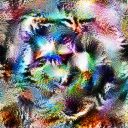

--------------------
33


100%|██████████| 512/512 [00:21<00:00, 23.45it/s]



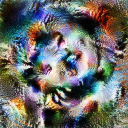

--------------------
34


100%|██████████| 512/512 [00:21<00:00, 24.26it/s]



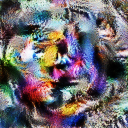

--------------------
35


100%|██████████| 512/512 [00:20<00:00, 24.49it/s]



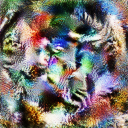

--------------------
36


100%|██████████| 512/512 [00:21<00:00, 23.61it/s]



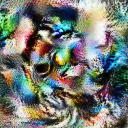

--------------------
37


100%|██████████| 512/512 [00:20<00:00, 24.65it/s]



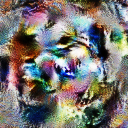

--------------------
38


100%|██████████| 512/512 [00:21<00:00, 23.94it/s]



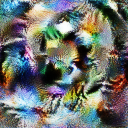

--------------------
39


100%|██████████| 512/512 [00:21<00:00, 23.41it/s]



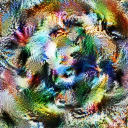

--------------------
40


100%|██████████| 512/512 [00:20<00:00, 24.69it/s]



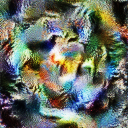

--------------------
41


100%|██████████| 512/512 [00:21<00:00, 23.45it/s]



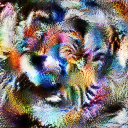

--------------------
42


100%|██████████| 512/512 [00:21<00:00, 23.62it/s]



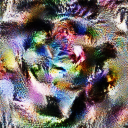

--------------------
43


  0%|          | 0/512 [00:00<?, ?it/s]


IndexError: index 43 is out of bounds for dimension 1 with size 43

In [ ]:
import torch
from lucent.modelzoo import vgg19, util
from cadena_model import VggModel

vgg_pretrained = vgg19(pretrained = True)

gpu_to_use = 0
n_neurons = 43
layer = 0


GPU = torch.cuda.is_available()
net = VggModel(pretrained_model=vgg_pretrained, conv_layer=layer, num_neurons=n_neurons, device = torch.device("cuda:"+str(gpu_to_use) if GPU else "cpu"))
net.cuda()


list_imgs_untrained = []
for i in range(0, 43):
    print(i)
    img = render.render_vis(net, 'output:'+str(i), show_inline = 1)
    list_imgs_untrained.append(img[0][0, :, :, :])
    print('--------------------')

f, ax = plt.subplots(5,10, figsize=(20,20))
for n, (i, j) in enumerate(itertools.product(list(range(10)), list(range(10)))):
    print(n)
    if n == 43:
        break
    ax[i, j].imshow(list_imgs_untrained[n])
#plt.savefig('Model_3_10__untrained_neurons_lucent.png', dpi=150)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43


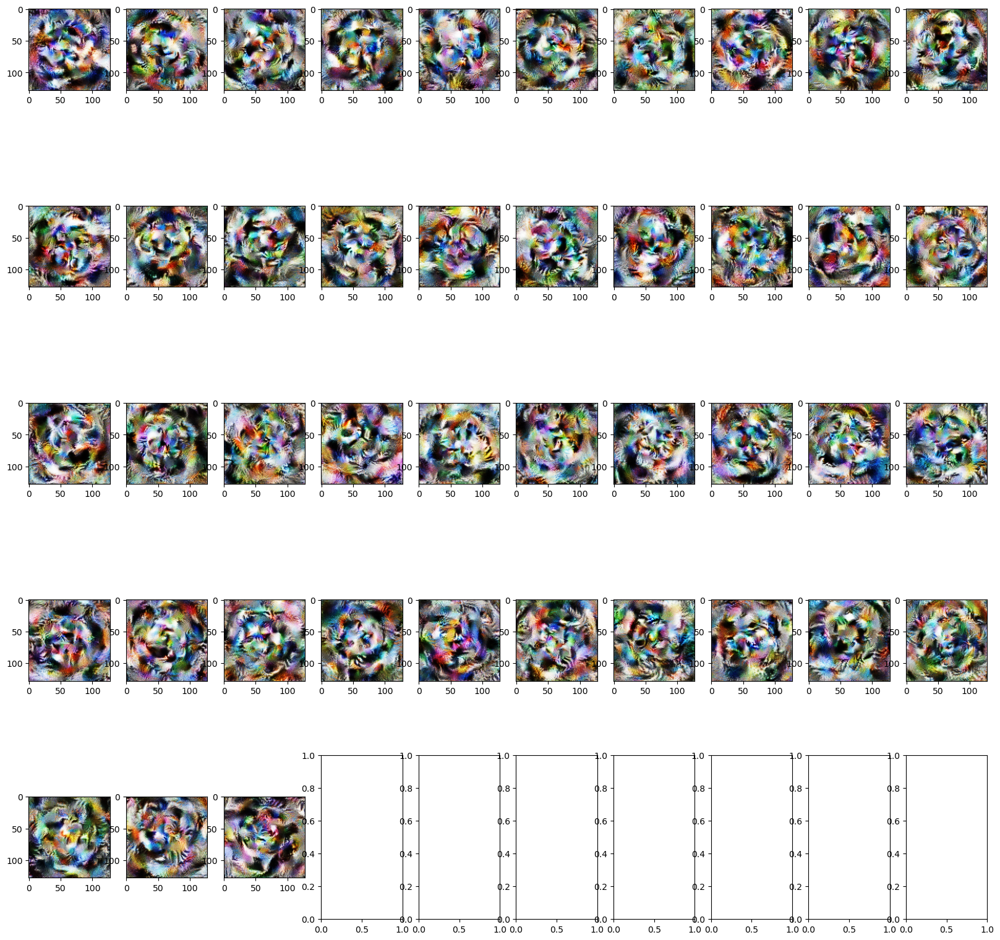

In [25]:
f, ax = plt.subplots(5,10, figsize=(20,20))
for n, (i, j) in enumerate(itertools.product(list(range(10)), list(range(10)))):
    print(n)
    if n == 43:
        break
    ax[i, j].imshow(list_imgs_untrained[n])
#plt.savefig('Model_3_10__untrained_neurons_lucent.png', dpi=150)